# Part 1 - Data Analysis

This notebook contains basic analysis of the dataset.

## Initial Setup

In [37]:
!pip3 install pandas numpy matplotlib seaborn

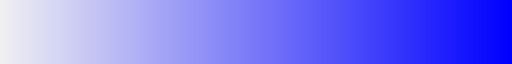

In [81]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Set style for better visualizations
sns.set_style("whitegrid")
sns.color_palette("light:b", as_cmap=True)


## Data Extraction and Explorations - Training Data

In [39]:
# Load the data
df_train = pd.read_csv("../data/training_v2.csv")

# Display basic information about the dataset
print("Dataset Shape:")
print(df_train.shape)
print("First few rows:")
display(df_train.head())


Dataset Shape:
(91713, 186)
First few rows:


,encounter_id,patient_id,hospital_id,hospital_death,age,bmi,elective_surgery,ethnicity,gender,height,...,aids,cirrhosis,diabetes_mellitus,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,apache_3j_bodysystem,apache_2_bodysystem
0,66154,25312,118,0,68.0,22.73,0,Caucasian,M,180.3,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,Sepsis,Cardiovascular
1,114252,59342,81,0,77.0,27.42,0,Caucasian,F,160.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,Respiratory,Respiratory
2,119783,50777,118,0,25.0,31.95,0,Caucasian,F,172.7,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Metabolic,Metabolic
3,79267,46918,118,0,81.0,22.64,1,Caucasian,F,165.1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Cardiovascular,Cardiovascular
4,92056,34377,33,0,19.0,NaN,0,Caucasian,M,188.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Trauma,Trauma


In [40]:
# Basic statistical summary
print("Statistical Summary:")
display(df_train.describe())

Statistical Summary:


,encounter_id,patient_id,hospital_id,hospital_death,age,bmi,elective_surgery,height,icu_id,pre_icu_los_days,...,apache_4a_hospital_death_prob,apache_4a_icu_death_prob,aids,cirrhosis,diabetes_mellitus,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis
count,91713.000000,91713.000000,91713.000000,91713.000000,87485.000000,88284.000000,91713.000000,90379.000000,91713.000000,91713.000000,...,83766.000000,83766.000000,90998.000000,90998.000000,90998.000000,90998.000000,90998.000000,90998.000000,90998.000000,90998.000000
mean,65606.079280,65537.131464,105.669262,0.086302,62.309516,29.185818,0.183736,169.641588,508.357692,0.835766,...,0.086787,0.043955,0.000857,0.015693,0.225192,0.012989,0.026165,0.007066,0.004132,0.020638
std,37795.088538,37811.252183,62.854406,0.280811,16.775119,8.275142,0.387271,10.795378,228.989661,2.487756,...,0.247569,0.217341,0.029265,0.124284,0.417711,0.113229,0.159628,0.083763,0.064148,0.142169
min,1.000000,1.000000,2.000000,0.000000,16.000000,14.844926,0.000000,137.200000,82.000000,-24.947222,...,-1.000000,-1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,32852.000000,32830.000000,47.000000,0.000000,52.000000,23.641975,0.000000,162.500000,369.000000,0.035417,...,0.020000,0.010000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,65665.000000,65413.000000,109.000000,0.000000,65.000000,27.654655,0.000000,170.100000,504.000000,0.138889,...,0.050000,0.020000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,98342.000000,98298.000000,161.000000,0.000000,75.000000,32.930206,0.000000,177.800000,679.000000,0.409028,...,0.130000,0.060000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,131051.000000,131051.000000,204.000000,1.000000,89.000000,67.814990,1.000000,195.590000,927.000000,159.090972,...,0.990000,0.970000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


Questions:
1. Do we want to remove patients that are under 18? 
2.

Features with a high percentage of missing values:


,Missing Values,Percentage
h1_bilirubin_max,84619,92.265001
h1_bilirubin_min,84619,92.265001
h1_lactate_max,84369,91.992411
h1_lactate_min,84369,91.992411
h1_albumin_min,83824,91.398166
...,...,...
h1_glucose_max,52614,57.368094
h1_glucose_min,52614,57.368094
d1_albumin_max,49096,53.532215
d1_albumin_min,49096,53.532215


Features with no missing values:


,Missing Values,Percentage,range
encounter_id,0,0.0,NaN
patient_id,0,0.0,NaN
hospital_id,0,0.0,NaN
hospital_death,0,0.0,NaN
elective_surgery,0,0.0,NaN
icu_id,0,0.0,NaN
icu_stay_type,0,0.0,NaN
icu_type,0,0.0,NaN
pre_icu_los_days,0,0.0,NaN
readmission_status,0,0.0,NaN


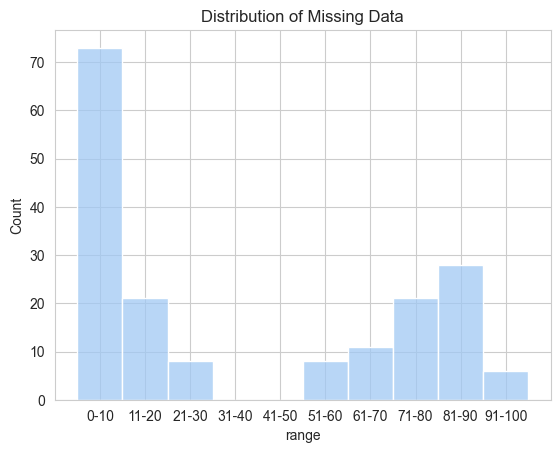

In [122]:
# Check for missing values
missing_values = df_train.isnull().sum()
missing_percentage = (missing_values / len(df_train)) * 100

missing_data = pd.DataFrame({
    "Missing Values": missing_values,
    "Percentage": missing_percentage
})

# Print all column names that have a missing values percent of over 50% - these are columns that most probably will be dropped or imputed
print("Features with a high percentage of missing values:")
display(missing_data[missing_data["Percentage"] >= 50].sort_values("Percentage", ascending=False))

bins = [0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100]
labels = ["0-10", "11-20", "21-30", "31-40", "41-50", "51-60", "61-70", "71-80", "81-90", "91-100"]
missing_data["range"] = pd.cut(missing_data["Percentage"], bins=bins, labels=labels)


sns.histplot(data=missing_data["range"])
plt.title("Distribution of Missing Data")
plt.savefig("missing_data_distribution.png", transparent=True)

# Print all column names that don't have any missing values
print("Features with no missing values:")
display(missing_data[missing_data["Missing Values"] == 0])

As we can see in the distribution of missing data percentage - it's either less than ~30% or more than ~50%.
Imputation of features that have more `NaN` fields than actual values can create problems.

In [42]:
# Remove features that have a high number of missing data
final_feature_coulmns = missing_data[missing_data["Percentage"] < 50].index
display(final_feature_coulmns)

Index(['encounter_id', 'patient_id', 'hospital_id', 'hospital_death', 'age',
       'bmi', 'elective_surgery', 'ethnicity', 'gender', 'height',
       ...
       'aids', 'cirrhosis', 'diabetes_mellitus', 'hepatic_failure',
       'immunosuppression', 'leukemia', 'lymphoma',
       'solid_tumor_with_metastasis', 'apache_3j_bodysystem',
       'apache_2_bodysystem'],
      dtype='object', length=112)

Some of the demogrphic data will be irrelevant in the final model - `encounter_id`, `patient_id`, `hospital_id`, etc... - they are index data and are reduntant

### Figures and Plots

In this section we'll explore some of the data features and try to understand if there are any pre-processing steps that we'll need to perform.

#### Survival

We want to see the distribution of survival in the dataset. 
We've created the following plots:
1. General Distribution - Shows the general distribution (male and female) 
2. Distribution by Gender
3. Distribution by Age and Gender

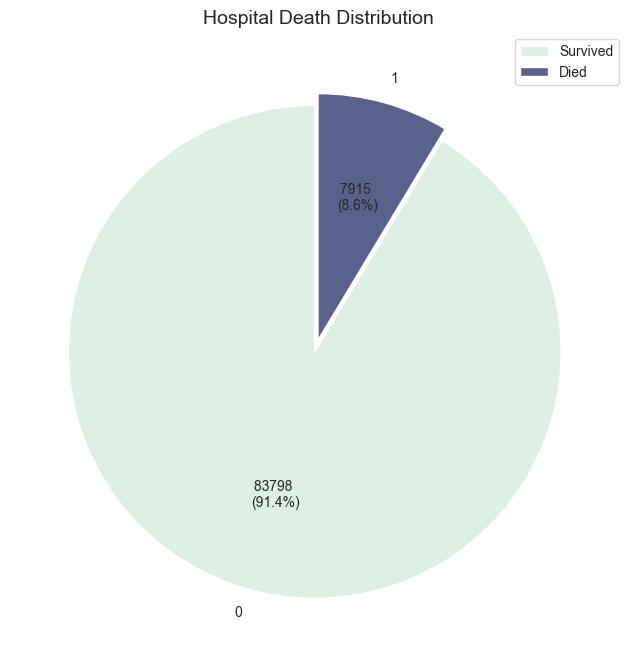

In [111]:
# Create a pie chart for hospital_death
plt.figure(figsize=(8, 8))
counts = df_train["hospital_death"].value_counts()


# Create a function to display both count and percentage
def autopct_format(values):
    def my_format(pct):
        total = sum(values)
        val = int(round(pct * total / 100.0))
        return "{v:d} \n({p:.1f}%)".format(v=val, p=pct)

    return my_format


counts.plot.pie(
    autopct=autopct_format(counts), startangle=90, explode=[0.05, 0], colors=["#deefe4", "#5a618b"]
)
plt.title("Hospital Death Distribution", fontsize=14)
plt.ylabel("")
plt.legend(["Survived", "Died"])
plt.savefig("hospital_death_general.png", transparent=True)


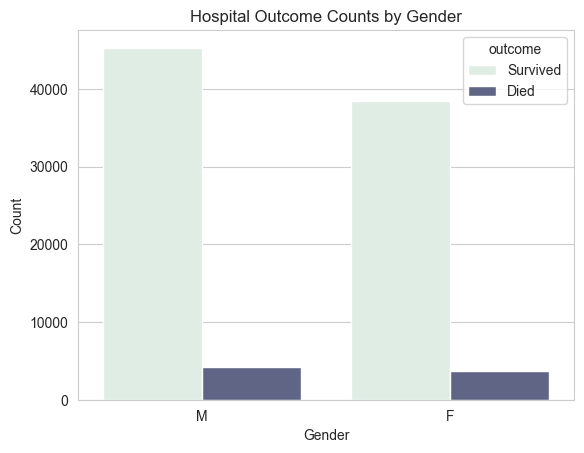

In [109]:
death_gender_df = df_train[["gender", "hospital_death"]].copy()
death_gender_df["outcome"] = death_gender_df["hospital_death"].map(
    {0: "Survived", 1: "Died"}
)

gender_palette = {
    "Survived": "#deefe4",
    "Died": "#5a618b",
}  # Purple for Female, Blue for Male

sns.countplot(x="gender", hue="outcome", data=death_gender_df, palette=gender_palette)
plt.title("Hospital Outcome Counts by Gender")
plt.ylabel("Count")
plt.xlabel("Gender")
plt.savefig("hospital_death_by_gender.png", transparent=True)


/var/folders/jk/2d1z788d6gs4d6n19ym0mv0h0000gn/T/ipykernel_81827/2400259580.py:6: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_train.groupby(["age_group", "gender"])["hospital_death"].mean() * 100


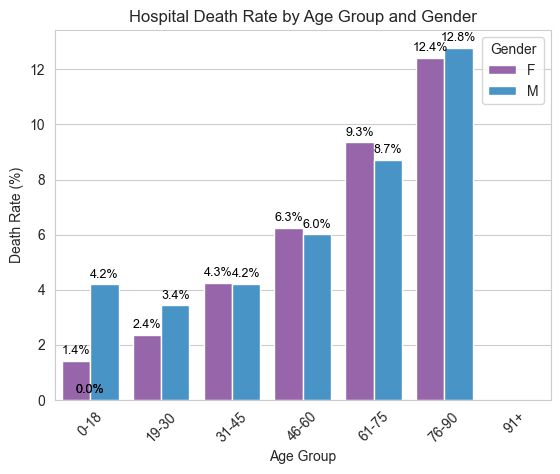

In [ ]:
bins = [0, 18, 30, 45, 60, 75, 90, 120]
labels = ["0-18", "19-30", "31-45", "46-60", "61-75", "76-90", "91+"]
df_train["age_group"] = pd.cut(df_train["age"], bins=bins, labels=labels)

age_gender_death = (
    df_train.groupby(["age_group", "gender"])["hospital_death"].mean() * 100
)
age_gender_death = age_gender_death.reset_index()
age_gender_death.columns = ["Age Group", "Gender", "Death Rate (%)"]

gender_palette = {
    "F": "#9b59b6",
    "M": "#3498db",
}  # Purple for Female, Blue for Male

# Plot the distribution of hospital death by age group and gender
bars = sns.barplot(
    x="Age Group",
    y="Death Rate (%)",
    hue="Gender",
    data=age_gender_death,
    palette=gender_palette,
)

for p in bars.patches:
    bars.annotate(
        f"{p.get_height():.1f}%",
        (p.get_x() + p.get_width() / 2.0, p.get_height()),
        ha="center",
        va="bottom",
        size=9,
        color="black",
        xytext=(0, 3),
        textcoords="offset points",
    )

plt.title("Hospital Death Rate by Age Group and Gender")
plt.xlabel("Age Group")
plt.ylabel("Death Rate (%)")
plt.tick_params(axis="x", rotation=45)
plt.legend(title="Gender")
plt.savefig("hospital_death_by_age_gender.png", transparent=True)


#### Age

/var/folders/jk/2d1z788d6gs4d6n19ym0mv0h0000gn/T/ipykernel_81827/1350326114.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_train.groupby(["age_group", "gender"]).size().reset_index(name="count")


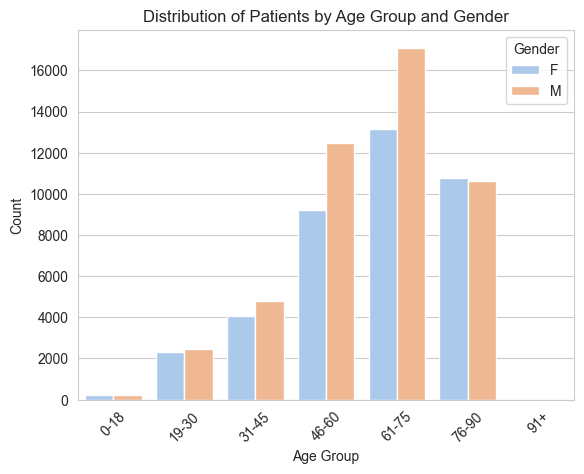

In [98]:
age_gender_counts = (
    df_train.groupby(["age_group", "gender"]).size().reset_index(name="count")
)

# Plot the distribution
sns.barplot(x="age_group", y="count", hue="gender", data=age_gender_counts)
plt.title("Distribution of Patients by Age Group and Gender")
plt.xlabel("Age Group")
plt.ylabel("Count")
plt.xticks(rotation=45)
plt.legend(title="Gender")


,encounter_id,patient_id,hospital_id,hospital_death,age,bmi,elective_surgery,height,icu_id,pre_icu_los_days,...,apache_4a_hospital_death_prob,apache_4a_icu_death_prob,aids,cirrhosis,diabetes_mellitus,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis
encounter_id,1.000000,-0.009575,-0.004532,-0.005243,-0.003990,-0.001068,0.002036,-0.005400,-0.000992,-0.000570,...,-0.000513,0.000344,0.001907,0.007601,0.003402,-0.000972,-0.001707,-0.002172,-0.001176,-0.004646
patient_id,-0.009575,1.000000,-0.007075,0.004877,0.006343,-0.001380,0.001387,0.002902,-0.001770,-0.004412,...,0.003735,0.001625,-0.002426,0.001307,0.000434,-0.001667,0.000548,0.000844,0.002333,-0.003065
hospital_id,-0.004532,-0.007075,1.000000,-0.001255,-0.008673,0.012874,0.052123,0.027895,0.004526,-0.001285,...,-0.006993,-0.000283,-0.004947,0.002962,0.011978,0.001362,0.000146,-0.002992,0.002588,-0.004730
hospital_death,-0.005243,0.004877,-0.001255,1.000000,0.111017,-0.031247,-0.093574,-0.019526,0.000994,0.063316,...,0.311043,0.283913,0.004403,0.039453,-0.015784,0.038864,0.043973,0.029788,0.018722,0.051105
age,-0.003990,0.006343,-0.008673,0.111017,1.000000,-0.087077,0.067320,-0.109937,-0.024257,0.049872,...,0.143167,0.076275,-0.029477,-0.028065,0.077908,-0.020061,0.025007,0.030310,0.023335,0.025924
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
hepatic_failure,-0.000972,-0.001667,0.001362,0.038864,-0.020061,-0.001855,-0.034700,0.010481,-0.011746,0.015063,...,0.024115,0.026941,0.003273,0.525905,0.010647,1.000000,0.003084,-0.001567,0.001689,0.007240
immunosuppression,-0.001707,0.000548,0.000146,0.043973,0.025007,-0.031144,-0.014695,0.000530,-0.031111,0.032695,...,0.038922,0.026268,0.025781,-0.002971,-0.002502,0.003084,1.000000,0.134934,0.103201,0.269653
leukemia,-0.002172,0.000844,-0.002992,0.029788,0.030310,-0.013375,-0.017587,0.001718,0.001014,0.041853,...,0.044126,0.031966,-0.002471,-0.005373,0.002890,-0.001567,0.134934,1.000000,0.031380,0.006210
lymphoma,-0.001176,0.002333,0.002588,0.018722,0.023335,-0.010017,-0.008215,0.008370,-0.002336,0.013954,...,0.018303,0.011287,0.021529,0.001516,-0.002326,0.001689,0.103201,0.031380,1.000000,0.014749


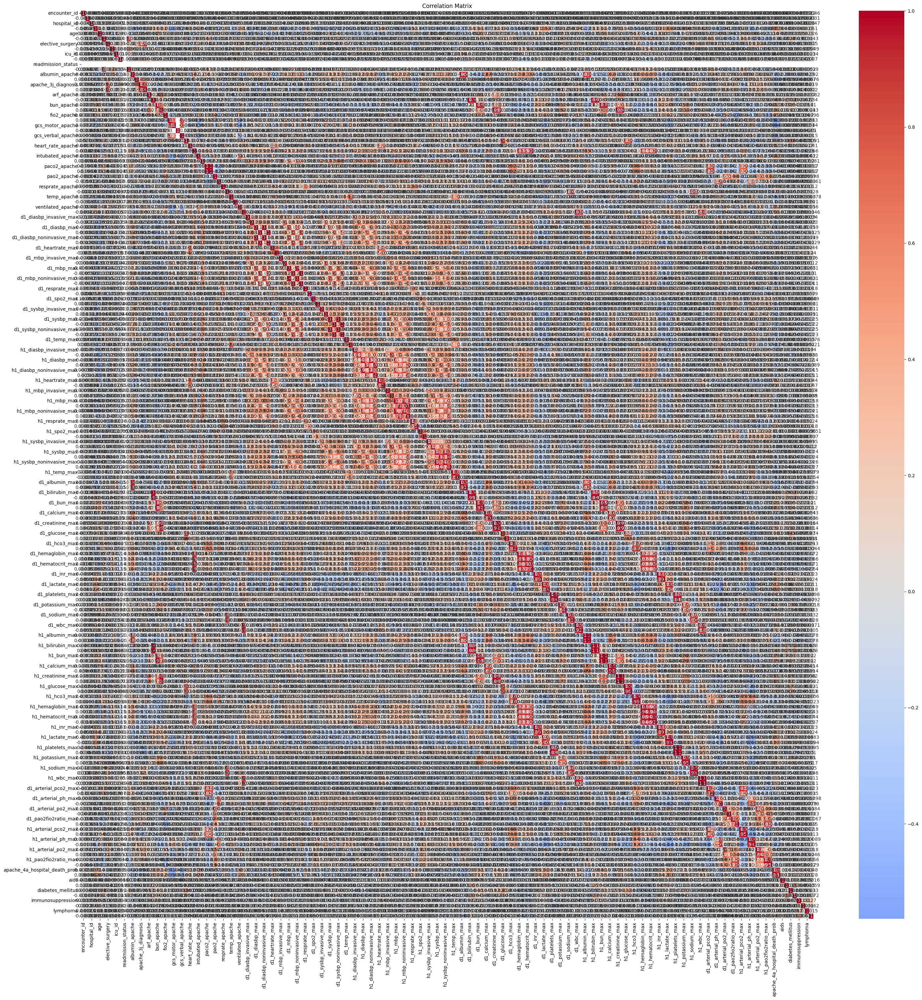

In [28]:
# Correlation analysis

# TODO - Select the specific columns / remove columns that aren't relevant 
# We want to analyze the correlation between the features and the target variable
numeric_df = df_train.select_dtypes(include=[np.number])
correlation_matrix = numeric_df.corr()

display(correlation_matrix)

# plt.figure(figsize=(30, 30))
# sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", center=0)
# plt.title("Correlation Matrix")
# plt.tight_layout()
# plt.show()

## Data Extraction and Exploration - Test Set

We want to make sure that the distribution of data is about the same as the distribution in the test set and that we don't have any abnormalities.

In [47]:
# Load the data
df_test = pd.read_csv("../data/unlabeled.csv")

# Display basic information about the dataset
print("Dataset Shape:")
print(df_test.shape)
print("First few rows:")
display(df_test.head())


Dataset Shape:
(39308, 186)
First few rows:


,encounter_id,patient_id,hospital_id,hospital_death,age,bmi,elective_surgery,ethnicity,gender,height,...,aids,cirrhosis,diabetes_mellitus,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,apache_3j_bodysystem,apache_2_bodysystem
0,2,127112,7,NaN,56.0,21.102439,0,Caucasian,M,180.3,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Neurological,Neurologic
1,5,130737,178,NaN,NaN,19.500595,1,Caucasian,F,145.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Neurological,Neurologic
2,7,101458,86,NaN,66.0,32.518596,1,African American,M,170.2,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Cardiovascular,Cardiovascular
3,8,48067,163,NaN,64.0,20.798520,0,Caucasian,M,182.8,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,Respiratory,Respiratory
4,10,25865,59,NaN,56.0,NaN,0,Caucasian,M,NaN,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Neurological,Neurologic


In [55]:
# Check for missing values
missing_values = df_test.isnull().sum()
missing_percentage = (missing_values / len(df_test)) * 100

missing_data = pd.DataFrame(
    {"Missing Values": missing_values, "Percentage": missing_percentage}
)

# Print all column names that have a missing values percent of over 40% - these are columns that will be dropped or imputed
print("Features with a high percentage of missing values:")
display(
    missing_data[missing_data["Percentage"] > 50].sort_values(
        "Percentage", ascending=False
    )
)

# Print all column names that don't have any missing values
print("Features with no missing values:")
display(missing_data[missing_data["Missing Values"] == 0])


Features with a high percentage of missing values:


,Missing Values,Percentage
hospital_death,39308,100.000000
h1_bilirubin_min,36054,91.721787
h1_bilirubin_max,36054,91.721787
h1_albumin_max,35984,91.543706
h1_albumin_min,35984,91.543706
...,...,...
d1_bilirubin_max,23584,59.997965
h1_glucose_max,23015,58.550422
h1_glucose_min,23015,58.550422
d1_albumin_min,22801,58.006004


Features with no missing values:


,Missing Values,Percentage
encounter_id,0,0.0
patient_id,0,0.0
hospital_id,0,0.0
elective_surgery,0,0.0
icu_id,0,0.0
icu_stay_type,0,0.0
icu_type,0,0.0
pre_icu_los_days,0,0.0
readmission_status,0,0.0
apache_post_operative,0,0.0


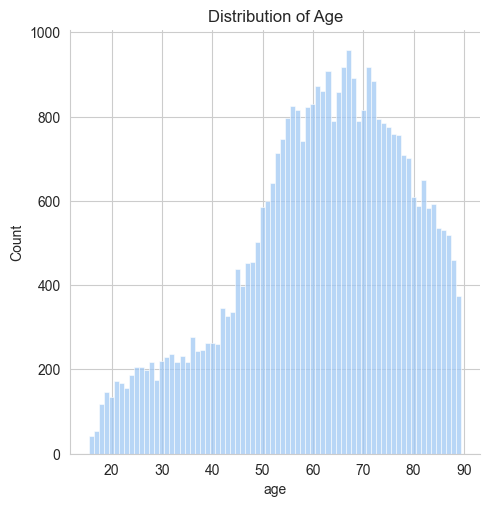

In [57]:
sns.displot(data=df_test["age"], discrete=True)
plt.title("Distribution of Age")
plt.show()


### Initial Data Cleaning

In [132]:
# df_train_cleaned = df_train.drop(columns=["encounter_id", "hospital_id"])
# df_test_cleaned = df_test.drop(columns=["encounter_id", "hospital_id"])

df_train_cleaned = pd.read_csv("../data/training_v2.csv")
df_test_cleaned = pd.read_csv("../data/unlabeled.csv")

missing_values = df_train_cleaned.isnull().sum()
missing_percentage = (missing_values / len(df_train_cleaned)) * 100

missing_data = pd.DataFrame(
    {"Missing Values": missing_values, "Percentage": missing_percentage}
)


# Remove features that have a high number of missing data
final_feature_coulmns = missing_data[missing_data["Percentage"] <= 70].index
display(final_feature_coulmns)

indexes = missing_data[
    missing_data["Missing Values"].isin(
        ["apache_4a_hospital_death_prob", "apache_4a_icu_death_prob"]
    )
].index

final_feature_coulmns = final_feature_coulmns.drop(indexes)

# Keep only columns in final_feature_coulmns
df_train_cleaned = df_train_cleaned[final_feature_coulmns]
df_test_cleaned = df_test_cleaned[final_feature_coulmns]

df_train_cleaned.to_csv("../data/training_v2_cleaned.csv", index=False)
df_test_cleaned.to_csv("../data/unlabeled_cleaned.csv", index=False)



Index(['encounter_id', 'patient_id', 'hospital_id', 'hospital_death', 'age',
       'bmi', 'elective_surgery', 'ethnicity', 'gender', 'height',
       ...
       'aids', 'cirrhosis', 'diabetes_mellitus', 'hepatic_failure',
       'immunosuppression', 'leukemia', 'lymphoma',
       'solid_tumor_with_metastasis', 'apache_3j_bodysystem',
       'apache_2_bodysystem'],
      dtype='object', length=131)